In [44]:
import numpy as np
import pandas as pd
import xarray as xr
import dask.array as da
from shapely.geometry import Polygon
import rasterio.features
import matplotlib.pyplot as plt
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import spatialdata as sd
from pathlib import Path
from spatialdata.transformations import Affine, Sequence, set_transformation, Scale
import sopa

import warnings
warnings.filterwarnings('ignore')

import sys
import os
sys.path.append(os.path.abspath('/media/Lynn/src'))
import load_sdata, align_sdata

## Load and crop Xenium data at a specific core

In [2]:
sdata_xenium_s1 = load_sdata.get_xenium_slide_data('0022110')  

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.2186082276047674].


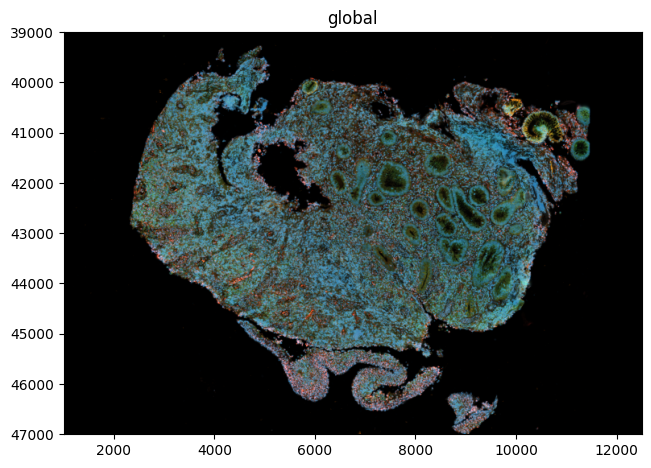

In [3]:
crop0 = lambda x: sd.bounding_box_query(
    x,
    min_coordinate=[1000, 39000],
    max_coordinate=[12500, 47000],
    axes=("x", "y"),
    target_coordinate_system="global",
)

spot_3_column_2 = crop0(sdata_xenium_s1['column_2'])
spot_3_column_2.pl.render_images("morphology_focus").pl.show() 

## Convert to Xenium Explorer format for alignment with the CODEX image

In [9]:
del spot_3_column_2.tables['table']
sopa.io.explorer.write(Path('../data/Aligned_Xenium_Explorer_data/s1_c2_spot3'), spot_3_column_2, shapes_key = 'cell_boundaries')

[INFO] (sopa.io.explorer.shapes) Writing 38610 cell polygons
[INFO] (sopa.io.explorer.points) Writing 2512365 transcripts
[INFO] (sopa.io.explorer.points)    > Level 0: 2512365 transcripts
[INFO] (sopa.io.explorer.points)    > Level 1: 628091 transcripts
[INFO] (sopa.io.explorer.points)    > Level 2: 157022 transcripts
[INFO] (sopa.io.explorer.points)    > Level 3: 39255 transcripts
[INFO] (sopa.io.explorer.points)    > Level 4: 9813 transcripts
[INFO] (sopa.io.explorer.images) Writing multiscale image with procedure=semi-lazy (load in memory when possible)
[INFO] (sopa.io.explorer.images)    (Loading image of shape (5, 8000, 11500)) in memory
[INFO] (sopa.io.explorer.images)    > Image of shape (5, 8000, 11500)
[INFO] (sopa.io.explorer.images)    > Image of shape (5, 4000, 5750)
[INFO] (sopa.io.explorer.images)    > Image of shape (5, 2000, 2875)
[INFO] (sopa.io.explorer.images)    > Image of shape (5, 1000, 1437)
[INFO] (sopa.io.explorer.images)    > Image of shape (5, 500, 718)
[INF

## Load and align Xenium and CODEX images

### Convert CODEX ome tif image to zarr

In [10]:
codex_path_read = Path('../data/Aligned_Xenium_Explorer_data/')  
codex_path_write = Path('../data/SpatialData/CODEX_cropped/')  

codex_path_write.mkdir(parents=True, exist_ok=True)

filename = "s1_c2_spot3_codex.ome.ome.tif"  
file = codex_path_read / filename

if file.is_file() and not file.name.startswith("._"):  # Ignore hidden/system files
    input_path = str(file)
    output_path = str(codex_path_write / f"{file.stem}.zarr")

    print(f"Processing: {file.name}")

    try:
        # Parse the data
        print("Parsing the data... ", end="")
        sdata = sopa.io.ome_tif(path=input_path)
        print("done")

        # Write the data
        print("Writing the data... ", end="")
        sdata.write(output_path)
        print("done")

    except Exception as e:
        print(f"Skipping {file.name} due to error: {e}")
else:
    print(f"File {file.name} not found or is not a valid file.")

print("Processing complete.")

Processing: s1_c2_spot3_codex.ome.ome.tif
Parsing the data... done
Writing the data... INFO     The Zarr backing store has been changed from None the new file path:                                      
         ../data/SpatialData/CODEX_cropped/s1_c2_spot3_codex.ome.ome.zarr                                          
done
Processing complete.


In [11]:
codex_path = Path('../data/SpatialData/CODEX_cropped/s1_c2_spot3_codex.ome.ome.zarr')  
codex_sdata = sd.read_zarr(codex_path)

version mismatch: detected: RasterFormatV02, requested: FormatV04


In [12]:
codex_sdata

SpatialData object, with associated Zarr store: /media/Lynn/data/SpatialData/CODEX_cropped/s1_c2_spot3_codex.ome.ome.zarr
└── Images
      └── 's1_c2_spot3_codex': DataTree[cyx] (27, 4133, 4802), (27, 2066, 2401), (27, 1033, 1200), (27, 516, 600), (27, 258, 300)
with coordinate systems:
    ▸ 'pixels', with elements:
        s1_c2_spot3_codex (Images)

### Align images

In [13]:
alignment_file = Path('/media/Lynn/alignment/s1_c2_spot3_alignment_files/matrix.csv')

aligned_sdata = align_sdata.align_images_using_alignment_matrix(
    codex_sdata, 
    spot_3_column_2, 
    alignment_file
)

In [14]:
aligned_sdata

SpatialData object
├── Images
│     ├── 'morphology_focus': DataTree[cyx] (5, 8000, 11500), (5, 4000, 5750), (5, 2000, 2874), (5, 1000, 1437), (5, 500, 718)
│     └── 's1_c2_spot3_codex': DataTree[cyx] (27, 4133, 4802), (27, 2066, 2401), (27, 1033, 1200), (27, 516, 600), (27, 258, 300)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (8000, 11500), (4000, 5750), (2000, 2874), (1000, 1437), (500, 718)
│     └── 'nucleus_labels': DataTree[yx] (8000, 11500), (4000, 5750), (2000, 2874), (1000, 1437), (500, 718)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (38610, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (38594, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (38441, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (38594, 422)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), s1_c2_spot3_codex (Images), cell

In [15]:
codex_image = aligned_sdata.images['s1_c2_spot3_codex']

In [8]:
codex_image

<xarray.DataTree>
Group: /
├── Group: /scale0
│       Dimensions:  (c: 27, y: 4133, x: 4802)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 33kB 0.5 1.5 2.5 3.5 ... 4.13e+03 4.132e+03 4.132e+03
│         * x        (x) float64 38kB 0.5 1.5 2.5 3.5 ... 4.8e+03 4.8e+03 4.802e+03
│       Data variables:
│           image    (c, y, x) uint16 1GB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
├── Group: /scale1
│       Dimensions:  (c: 27, y: 2066, x: 2401)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 17kB 1.0 3.001 5.001 ... 4.128e+03 4.13e+03 4.132e+03
│         * x        (x) float64 19kB 1.0 3.0 5.0 7.0 ... 4.797e+03 4.799e+03 4.801e+03
│       Data variables:
│           image    (c, y, x) uint16 268MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
├── Group: /scale2
│       Dimensions:  (c: 27, y: 1033, x: 1200)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 8kB 2.0 6.001 10.0 ... 4.123e+03 4.127e+03 4.131e+03
│         * x        (x) float64 10kB 2.001 6.003 10.0 ... 4.792e+03 4.796e+03 4.8e+03
│       Data variables:
│           image    (c, y, x) uint16 67MB dask.array<chunksize=(1, 1024, 1024), meta=np.ndarray>
├── Group: /scale3
│       Dimensions:  (c: 27, y: 516, x: 600)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 4kB 4.005 12.01 20.02 ... 4.113e+03 4.121e+03 4.129e+03
│         * x        (x) float64 5kB 4.002 12.01 20.01 ... 4.782e+03 4.79e+03 4.798e+03
│       Data variables:
│           image    (c, y, x) uint16 17MB dask.array<chunksize=(1, 516, 600), meta=np.ndarray>
└── Group: /scale4
        Dimensions:  (c: 27, y: 258, x: 300)
        Coordinates:
          * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
          * y        (y) float64 2kB 8.01 24.03 40.05 ... 4.093e+03 4.109e+03 4.125e+03
          * x        (x) float64 2kB 8.003 24.01 40.02 ... 4.762e+03 4.778e+03 4.794e+03
        Data variables:
            image    (c, y, x) uint16 4MB dask.array<chunksize=(1, 258, 300), meta=np.ndarray>

In [18]:
new_codex_image = aligned_sdata.transform_element_to_coordinate_system(codex_image, 'global')

In [19]:
new_codex_image

<xarray.DataTree>
Group: /
├── Group: /scale0
│       Dimensions:  (c: 27, y: 9877, x: 11476)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 79kB 0.5 1.5 2.5 3.5 ... 9.874e+03 9.876e+03 9.876e+03
│         * x        (x) float64 92kB 0.5 1.5 2.5 3.5 ... 1.147e+04 1.147e+04 1.148e+04
│       Data variables:
│           image    (c, y, x) uint16 6GB dask.array<chunksize=(27, 4133, 4802), meta=np.ndarray>
├── Group: /scale1
│       Dimensions:  (c: 27, y: 4937, x: 5738)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 39kB 1.0 3.001 5.002 ... 9.872e+03 9.874e+03 9.876e+03
│         * x        (x) float64 46kB 1.0 3.0 5.0 7.0 ... 1.147e+04 1.147e+04 1.148e+04
│       Data variables:
│           image    (c, y, x) uint16 2GB dask.array<chunksize=(27, 2066, 2401), meta=np.ndarray>
├── Group: /scale2
│       Dimensions:  (c: 27, y: 2468, x: 2867)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 20kB 2.001 6.003 10.01 ... 9.871e+03 9.875e+03
│         * x        (x) float64 23kB 2.001 6.004 10.01 ... 1.147e+04 1.147e+04
│       Data variables:
│           image    (c, y, x) uint16 382MB dask.array<chunksize=(27, 1033, 1200), meta=np.ndarray>
├── Group: /scale3
│       Dimensions:  (c: 27, y: 1233, x: 1433)
│       Coordinates:
│         * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
│         * y        (y) float64 10kB 4.005 12.02 20.03 ... 9.865e+03 9.873e+03
│         * x        (x) float64 11kB 4.004 12.01 20.02 ... 1.146e+04 1.147e+04
│       Data variables:
│           image    (c, y, x) uint16 95MB dask.array<chunksize=(27, 516, 600), meta=np.ndarray>
└── Group: /scale4
        Dimensions:  (c: 27, y: 616, x: 716)
        Coordinates:
          * c        (c) <U15 2kB 'DAPI' 'FoxP3' 'aSMA' 'CD4' ... 'PNAd' 'CD16' 'CXCL13'
          * y        (y) float64 5kB 8.017 24.05 40.09 ... 9.837e+03 9.853e+03 9.869e+03
          * x        (x) float64 6kB 8.014 24.04 40.07 ... 1.144e+04 1.145e+04 1.147e+04
        Data variables:
            image    (c, y, x) uint16 24MB dask.array<chunksize=(27, 258, 300), meta=np.ndarray>

In [20]:
try:
    channel_names = list(new_codex_image['scale0'].data_vars['image'].c.values)
    print(f"Using {len(channel_names)} channel names from image.c.values")
except:
    channel_names = [f"Channel_{i}" for i in range(new_codex_image['scale0'].data_vars['image'].sizes['c'])]
    print(f"Created {len(channel_names)} generic channel names")

# Precompute full image once (Dask → NumPy)
print("Loading image into memory...")
image_data = new_codex_image['scale0'].data_vars['image'].compute()
print("Image loaded.")

Using 27 channel names from image.c.values
Loading image into memory...
Image loaded.


In [21]:
cell_boundaries= aligned_sdata.shapes['cell_boundaries']

In [22]:
new_boundaries = aligned_sdata.transform_element_to_coordinate_system(cell_boundaries, 'global')

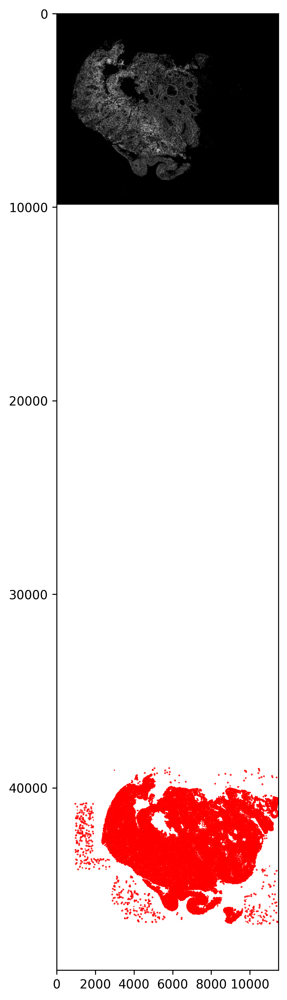

In [23]:
import matplotlib.pyplot as plt
img = new_codex_image['scale0'].image.values

# selecting a specific channel, e.g. DAPI (channel 0)
img_channel = img[0, :, :]

fig, ax = plt.subplots(figsize=(14, 14), dpi=300)
ax.imshow(img_channel, cmap='gray')
new_boundaries.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=0.5)

plt.axis('on')
plt.show()

In [25]:
xenium_aligned = aligned_sdata.transform_element_to_coordinate_system(aligned_sdata.images['morphology_focus'], 'global')

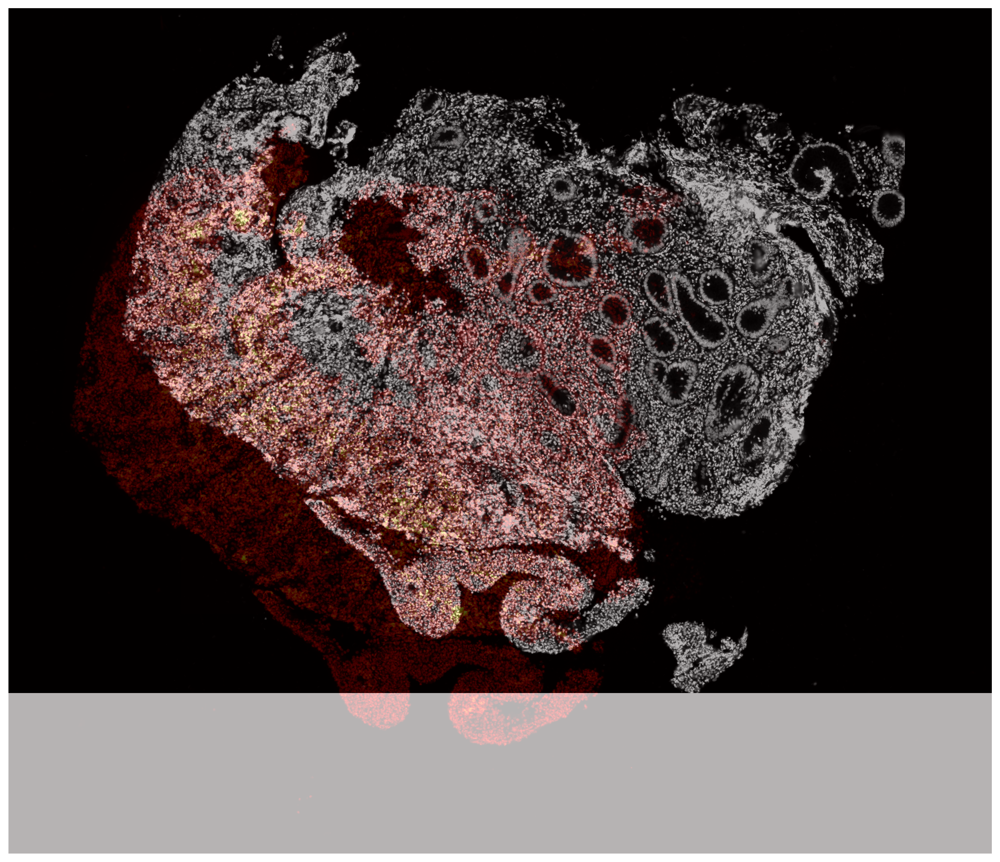

In [26]:
img1 = xenium_aligned['scale0'].image.values
img1_channel = img1[0, :, :]
img2 = new_codex_image['scale0'].image.values
img2_channel = img2[0, :, :]

fig, ax = plt.subplots(figsize=(15, 15), dpi=300)
ax.imshow(img1_channel, cmap='gray')
ax.imshow(img2_channel, cmap='hot', alpha=0.3)

plt.axis('off')
plt.show()

In [27]:
all_y = np.concatenate([np.array(poly.exterior.xy[1]) for poly in new_boundaries.geometry])
all_x = np.concatenate([np.array(poly.exterior.xy[0]) for poly in new_boundaries.geometry])


print("Y min:", all_y.min())
print("Y max:", all_y.max())
print("X min:", all_x.min())
print("X max:", all_x.max())

Y min: 38949.002757352944
Y max: 47061.001838235294
X min: 935.0
X max: 11462.000229779413


In [28]:
labels = sd.rasterize(
    data=new_boundaries,
    axes=("x", "y"),
    min_coordinate=[935.0, 38949.002757352944],
    max_coordinate=[11462.000229779413, 47061.001838235294],
    target_coordinate_system="global",
    target_unit_to_pixels=1.0
)

In [40]:
new_labels = sd.transform(labels, to_coordinate_system = 'global')

In [32]:
print("Y max:", new_codex_image['scale0'].y.values.max())
print("Y min:", new_codex_image['scale0'].y.values.min())
print("X max:", new_codex_image['scale0'].x.values.max())
print("X min:", new_codex_image['scale0'].x.values.min())

Y max: 9876.5
Y min: 0.5
X max: 11475.5
X min: 0.5


In [33]:
print("Y max:", new_labels.y.values.max())
print("Y min:", new_labels.y.values.min())
print("X max:", new_labels.x.values.max())
print("X min:", new_labels.x.values.min())

Y max: 8110.5
Y min: 0.5
X max: 10526.5
X min: 0.5


In [41]:
crop0 = lambda x: sd.bounding_box_query(
    x,
    min_coordinate=[0.5, 0.5],
    max_coordinate=[10526.5, 8110.5],
    axes=("x", "y"),
    target_coordinate_system="global",
)

cropped_boundaries = crop0(new_labels)
cropped_codex = crop0(new_codex_image)

In [42]:
print("Y max:", cropped_boundaries.y.values.max())
print("Y min:", cropped_boundaries.y.values.min())
print("X max:", cropped_boundaries.x.values.max())
print("X min:", cropped_boundaries.x.values.min())

AttributeError: 'NoneType' object has no attribute 'y'

In [43]:
# Interpolate CODEX image to label coords (nearest to keep values)
# Get label raster coordinates
x_lbl = labels.coords['x'].values
y_lbl = labels.coords['y'].values
codex_resampled = cropped_codex.interp(x=x_lbl, y=y_lbl, method='nearest')

print("CODEX resampled shape:", codex_resampled.shape)
print("Labels shape:", labels.shape)

AttributeError: 'DataTree' object has no attribute 'interp'

In [13]:
import matplotlib.pyplot as plt
img1 = cropped_boundaries.values
img1_channel = img1[0, :, :]
img2 = codex_resampled.values
img2_channel = img2[0, :, :]

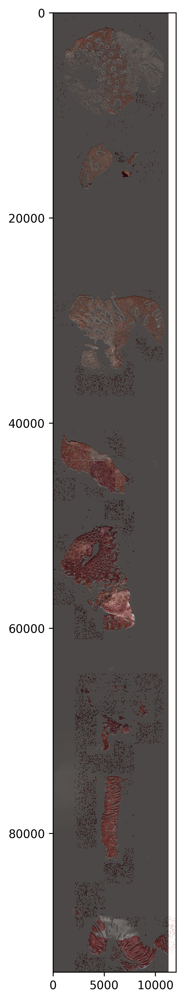

In [15]:
fig, ax = plt.subplots(figsize=(15, 15), dpi=300)

# First: Show the codex image in gray (background)
ax.imshow(img2_channel, cmap='gray', alpha=1.0)

# Second: Overlay the boundaries in red with transparency
ax.imshow(img1_channel, cmap='Reds', alpha=0.3)

plt.axis('on')

plt.savefig('/media/Lynn/pictures/Data_Integration/codex_with_xenium_boundaries_new.png', dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none')

plt.show()

## Marcel's Code

In [94]:
## Load libraries
import skimage as ski
import numpy as np
import skimage.io
import skimage.transform
import zarr
import tifffile
import matplotlib.pyplot as plt
import pandas as pd
from ome_types.model import OME, Image, Pixels, Channel
import cv2

## Define variables
opt = {}
opt["pool"] = "ID_0022110_column_1"
opt["segmentation"] = "/media/Lynn/data/Lisa_raw_data/Xenium/output-XETG00404__0022110__Region_1__20250117__150603/cells.zarr.zip"
opt["phenocycler"] = "/media/Lynn/data/CODEX_cropped/ID_0022110_column_1.ome.ome.tif"
opt["transmat"] = "/media/Lynn/alignment/codex_columns/ID_0022110_column_1.ome_alignment_files/matrix.csv"
opt["transsegmentation"] = "/media/Lynn/data/Integrated_data/ID_0022110_column_1/segmentation.csv"
opt["adtcsv"] = "/media/Lynn/data/Integrated_data/ID_0022110_column_1/adt_countmat.csv"
opt["adtcsv_cell_ids"] = "/media/Lynn/data/Integrated_data/ID_0022110_column_1/adt_countmat_with_cell_ids.csv"
opt["plotlowres"] = "/media/Lynn/data/Integrated_data/ID_0022110_column_1/" + opt["pool"] + "_new_cell_dapi_low.ome.tif"
opt["plothighres"] = "/media/Lynn/data/Integrated_data/ID_0022110_column_1/" + opt["pool"] + "_new_cell_dapi_high.ome.tif"
opt["plotsegmentation"] = "/media/Lynn/data/Integrated_data/ID_0022110_column_1/" + opt["pool"] + "_new_trans_segmentation.tiff"

opt["tilesize"] = 1024
opt["compression"] = "zlib"
opt["subresolution"] = 4
opt["interpreter"] = "rgb"
opt["scale"] = 2

In [51]:
## Load data
#### Load the cell segmentation matrix
# Function to open a Zarr file
def open_zarr(path: str) -> zarr.Group:
    store = (zarr.ZipStore(path, mode="r")
    if path.endswith(".zip")
    else zarr.DirectoryStore(path)
    )
    return zarr.group(store=store)

# For example, use the above function to open the cells Zarr file, which contains segmentation mask Zarr arrays
root = open_zarr(opt["segmentation"])

# Create cell and nucleus segmentation mask np array objects to read or modify
cellseg_mask = np.array(root["masks"][1])
#nucseg_mask = np.array(root["masks"][0])

root.info
root.tree() # shows structure, array dimensions, data types
np.array(root["cell_id"])
np.array(root["cell_summary"])
cellseg_mask.shape

np.array(root["masks"])

#### Load transformation matrix
transmat = np.loadtxt(opt["transmat"], delimiter=",")
#### For whatever reason x and y coordinates are flipped 
#transmat_new = np.array([transmat[1,],transmat[0,],transmat[2,]])

## Analysis
#### The the segmentation in a format the skikit image understands
tform = skimage.transform.AffineTransform(matrix = transmat)
#tform_inv = tform.inverse # inverse to get xenium data into phenocycler space

#### Load the IF image
tiff = tifffile.imread(opt["phenocycler"], is_ome=False, level=0) # this will import a list of images

#### Optionally subset the data for testing
# cellseg_mask = cellseg_mask[6000:10000, 0:int(cellseg_mask.shape[1] * 0.5)]
# cellseg_mask = cellseg_mask[95400:101000, 39600:45700]

#### Overlay segmentation matrix
tiff_dapi = tiff[0,:,:] # get the dapi image
#tiff_dapi = tiff[:,:,0] # get the dapi image
# tiff_dapi = tiff_dapi[6000:8500, 6000:8500]
tiff_dapi.shape

#### Apply the transformation matrix to the cell segmentation matrix
trans_mask = skimage.transform.warp(image = cellseg_mask, inverse_map = tform, output_shape = tiff_dapi.shape, order = 0, preserve_range=True).astype(int)

#### Resize the segmentation maks
#trans_mask_resized = skimage.transform.resize(trans_mask, tiff_dapi.shape, order=0, preserve_range = True, anti_aliasing = False).astype(int)

print("Saving the transposed segmentation mask")
#np.savetxt(opt["transsegmentation"], trans_mask, delimiter=",", fmt="%d") # use "%.3f" for floats

cell_borders = ski.segmentation.find_boundaries(trans_mask, mode="thin")

# Normalize grayscale image
def normalize(img):
    return ski.exposure.rescale_intensity(img, in_range="image", out_range=(0, 1))
  
gray_norm = normalize(tiff_dapi)

## Increase the brightness
gray_norm = np.clip(gray_norm * 1.75, 0, 1)

# Create an RGB image from the grayscale
rgb_image = np.stack([gray_norm]*3, axis=-1)  # shape: (H, W, 3)

## Alternative have the DAPI as white
# rgb_image = np.zeros((*gray_norm.shape, 3), dtype=np.float32)
# rgb_image[..., 2] = gray_norm


# rgb_image = np.stack([tiff_dapi]*3, axis=-1)  # shape: (H, W, 3)
# rgb_image = np.stack([trans_tiff]*3, axis=-1)  # shape: (H, W, 3)

# Overlay red where mask == 1
# rgb_image[trans_mask_resized > 0] = [1.0, 0.0, 0.0]  # red: R=1, G=0, B=0
rgb_image[cell_borders] = [1.0, 0.0, 0.0]  # red: R=1, G=0, B=0
# rgb_image = rgb_image[95400:101000, 39600:45700]
#rgb_image = rgb_image.astype("uint16")

# rgb_image.dtype
# 
# plt.imshow(gray_norm[7500:8000, 7500:8000])
# tiff_dapi.shape
# plt.imshow(rgb_image[7500:8000, 7500:8000, :])
# plt.show()
# rgb_image.shape

# Display
image_down = ski.transform.resize(rgb_image, (int(rgb_image.shape[0] * 0.25), int(rgb_image.shape[1] * 0.25)), anti_aliasing=True)
  
#img_name = opt["plot"] + opt["pool"] + "_cell_down_dapi.tiff"

# Save as TIFF
def save_as_ome(image, filename, subresolution = 3, scale = 2, tilesize = 1024, interpreter = "rgb", compression = "zlib"):
  print("Turning image into a pyramid")
  
   # Convert (Y, X, C) to (C, Y, X)
  if image.ndim == 3 and image.shape[2] == 3:
    print("Re-ordering image")
    image = np.moveaxis(image, -1, 0)  # (3, Y, X)
  
  ## Turn into a pyramid
  pyramid = [image]
  
  ## Downsample
  for i in range(1, subresolution):  # 1 downsampled level
    downsampled = pyramid[-1][:, ::scale, ::scale]
    pyramid.append(downsampled)
    
  for i, level in enumerate(pyramid):
    print(f"Level {i} shape: {level.shape}")
    
  if str(image.dtype) == "float64":
    image_type = "float"
  else:
    image_type = str(image.dtype)
    
  print("Making metadata")
  pixels = Pixels(
    dimension_order="XYZCT",
    size_x=image.shape[2],
    size_y=image.shape[1],
    size_z=1,
    size_c=image.shape[0],
    size_t=1,
    type=image_type,
    physical_size_x=0.125,
    physical_size_y=0.125,
    physical_size_x_unit="µm",
    physical_size_y_unit="µm",
    channels=[
            Channel(id="Channel:0:0", name="Red", samples_per_pixel=1),
            Channel(id="Channel:0:1", name="Green", samples_per_pixel=1),
            Channel(id="Channel:0:2", name="Blue", samples_per_pixel=1),
        ],
  )
  
  ome = OME(images=[Image(id="Image:0", name="Pyramidal OME", pixels=pixels)])
  
  metadata={"axes": "CYX", "ome": ome}
  
  print("Saving file")

  with tifffile.TiffWriter(filename, bigtiff=True) as tif:
    # Write base layer with SubIFDs for pyramids
    tif.write(
        data=pyramid[0],
        photometric=interpreter,
        tile=(tilesize, tilesize),
        compression=compression,
        subifds=len(pyramid) - 1,
        metadata={"axes": "CYX", "ome": ome}
    )

    # Write pyramid levels as SubIFDs
    for level in pyramid[1:]:
        tif.write(
            data=level,
            photometric=interpreter,
            tile=(tilesize, tilesize),
            compression=compression
        )

print("Writing low res image")
#ski.io.imsave(opt["plotlowres"], image_down)
save_as_ome(image_down, filename = opt["plotlowres"], subresolution = opt["subresolution"], scale = opt["scale"], tilesize = opt["tilesize"], interpreter = opt["interpreter"], compression = opt["compression"])

print("Writing high res image")
save_as_ome(rgb_image, filename = opt["plothighres"], subresolution = opt["subresolution"], scale = opt["scale"], tilesize = opt["tilesize"], interpreter = opt["interpreter"], compression = opt["compression"])
#ski.io.imsave(opt["plothighres"], rgb_image)

print("Writing transformed segmentation")
ski.io.imsave(opt["plotsegmentation"], trans_mask)
#trans_mask = ski.io.imread(opt["plotsegmentation"])

## Create an empty pandas data frame
df_adt = pd.DataFrame()

for i in range(0, len(tiff)):
  print(i)
  
  #### For each image quantify the signal per cell
  props = skimage.measure.regionprops(trans_mask, intensity_image = tiff[i])
  mean_signals = {prop.label: prop.mean_intensity for prop in props}
  df_adt[i] = mean_signals.values()

## Save as .csv file
df_adt.to_csv(opt["adtcsv"])

Saving the transposed segmentation mask
Writing low res image
Turning image into a pyramid
Re-ordering image
Level 0 shape: (3, 10371, 1245)
Level 1 shape: (3, 5186, 623)
Level 2 shape: (3, 2593, 312)
Level 3 shape: (3, 1297, 156)
Making metadata
Saving file
Writing high res image
Turning image into a pyramid
Re-ordering image
Level 0 shape: (3, 41487, 4981)
Level 1 shape: (3, 20744, 2491)
Level 2 shape: (3, 10372, 1246)
Level 3 shape: (3, 5186, 623)
Making metadata
Saving file
Writing transformed segmentation
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26


In [52]:
integrated_df = marker_df = pd.read_csv("/media/Lynn/data/Integrated_data/ID_0022110_column_1/adt_countmat.csv")

In [53]:
integrated_df

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,17,18,19,20,21,22,23,24,25,26
0,0,2298.041667,1.145833,6.166667,1272.468750,0.875000,74.020833,64.156250,23.708333,846.437500,...,15.343750,93.510417,69.614583,6.291667,15.812500,19.666667,156.187500,6.541667,2.062500,23.083333
1,1,9660.401575,2.763780,9.582677,1513.377953,2.921260,75.472441,109.692913,54.763780,804.440945,...,32.913386,136.590551,136.007874,8.015748,69.385827,32.795276,158.921260,14.141732,4.779528,34.354331
2,2,3565.448980,4.428571,10.948980,1596.010204,2.857143,88.418367,105.469388,59.040816,1087.081633,...,21.795918,140.581633,108.734694,7.295918,20.806122,22.571429,176.102041,7.265306,4.867347,29.653061
3,3,3629.280374,2.252336,12.663551,1531.308411,19.271028,85.551402,114.102804,68.448598,1254.785047,...,25.018692,160.429907,267.560748,9.280374,38.130841,43.364486,192.934579,11.439252,4.654206,26.925234
4,4,10472.338235,6.441176,10.735294,1618.669118,8.757353,91.816176,120.352941,55.294118,861.073529,...,33.661765,134.338235,213.845588,8.154412,80.382353,41.345588,198.448529,15.830882,6.647059,38.169118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143645,143645,118.432071,9.721604,3.583519,43.318486,4.028953,1.155902,15.084633,3.530067,1.218263,...,3.699332,15.697105,23.249443,3.282851,9.389755,3.652561,16.142539,2.501114,9.904232,63.365256
143646,143646,119.607539,9.490022,3.075388,41.862528,3.995565,1.217295,12.884701,4.237251,1.507761,...,3.388027,15.691796,23.024390,3.305987,10.368071,3.607539,16.649667,3.077605,11.656319,61.733925
143647,143647,117.491262,9.535922,3.279612,47.200000,2.796117,1.502913,14.007767,3.207767,1.493204,...,3.586408,13.900971,20.980583,3.683495,10.147573,4.735922,17.025243,17.933981,15.479612,62.025243
143648,143648,118.483193,10.445378,3.126050,47.771008,4.063025,1.052521,14.907563,3.783613,1.636555,...,3.714286,15.796218,23.155462,3.455882,9.413866,3.693277,14.911765,2.399160,9.386555,61.747899


In [75]:
np.unique(trans_mask)

array([     0,      4,      5, ..., 144060, 144061, 144062])

In [61]:
## Load data
#### Load the cell segmentation matrix
# Function to open a Zarr file
def open_zarr(path: str) -> zarr.Group:
    store = (zarr.ZipStore(path, mode="r")
    if path.endswith(".zip")
    else zarr.DirectoryStore(path)
    )
    return zarr.group(store=store)

# For example, use the above function to open the cells Zarr file, which contains segmentation mask Zarr arrays
root = open_zarr(opt["segmentation"])

# Create cell and nucleus segmentation mask np array objects to read or modify
cellseg_mask = np.array(root["masks"][1])
#nucseg_mask = np.array(root["masks"][0])

root.info
root.tree() # shows structure, array dimensions, data types
np.array(root["cell_id"])
np.array(root["cell_summary"])
cellseg_mask.shape

np.array(root["masks"])

#### Load transformation matrix
transmat = np.loadtxt(opt["transmat"], delimiter=",")
#### For whatever reason x and y coordinates are flipped 
#transmat_new = np.array([transmat[1,],transmat[0,],transmat[2,]])

## Analysis
#### The the segmentation in a format the skikit image understands
tform = skimage.transform.AffineTransform(matrix = transmat)
#tform_inv = tform.inverse # inverse to get xenium data into phenocycler space

#### Load the IF image
tiff = tifffile.imread(opt["phenocycler"], is_ome=False, level=0) # this will import a list of images

#### Optionally subset the data for testing
# cellseg_mask = cellseg_mask[6000:10000, 0:int(cellseg_mask.shape[1] * 0.5)]
# cellseg_mask = cellseg_mask[95400:101000, 39600:45700]

#### Overlay segmentation matrix
tiff_dapi = tiff[0,:,:] # get the dapi image
#tiff_dapi = tiff[:,:,0] # get the dapi image
# tiff_dapi = tiff_dapi[6000:8500, 6000:8500]
tiff_dapi.shape

#### Apply the transformation matrix to the cell segmentation matrix
trans_mask = skimage.transform.warp(image = cellseg_mask, inverse_map = tform, output_shape = tiff_dapi.shape, order = 0, preserve_range=True).astype(int)

#### Resize the segmentation maks
#trans_mask_resized = skimage.transform.resize(trans_mask, tiff_dapi.shape, order=0, preserve_range = True, anti_aliasing = False).astype(int)

print("Saving the transposed segmentation mask")
#np.savetxt(opt["transsegmentation"], trans_mask, delimiter=",", fmt="%d") # use "%.3f" for floats

cell_borders = ski.segmentation.find_boundaries(trans_mask, mode="thin")

# Normalize grayscale image
def normalize(img):
    return ski.exposure.rescale_intensity(img, in_range="image", out_range=(0, 1))
  
gray_norm = normalize(tiff_dapi)

## Increase the brightness
gray_norm = np.clip(gray_norm * 1.75, 0, 1)

# Create an RGB image from the grayscale
rgb_image = np.stack([gray_norm]*3, axis=-1)  # shape: (H, W, 3)

## Alternative have the DAPI as white
# rgb_image = np.zeros((*gray_norm.shape, 3), dtype=np.float32)
# rgb_image[..., 2] = gray_norm


# rgb_image = np.stack([tiff_dapi]*3, axis=-1)  # shape: (H, W, 3)
# rgb_image = np.stack([trans_tiff]*3, axis=-1)  # shape: (H, W, 3)

# Overlay red where mask == 1
# rgb_image[trans_mask_resized > 0] = [1.0, 0.0, 0.0]  # red: R=1, G=0, B=0
rgb_image[cell_borders] = [1.0, 0.0, 0.0]  # red: R=1, G=0, B=0
# rgb_image = rgb_image[95400:101000, 39600:45700]
#rgb_image = rgb_image.astype("uint16")

# rgb_image.dtype
# 
# plt.imshow(gray_norm[7500:8000, 7500:8000])
# tiff_dapi.shape
# plt.imshow(rgb_image[7500:8000, 7500:8000, :])
# plt.show()
# rgb_image.shape

# Display
image_down = ski.transform.resize(rgb_image, (int(rgb_image.shape[0] * 0.25), int(rgb_image.shape[1] * 0.25)), anti_aliasing=True)
  
#img_name = opt["plot"] + opt["pool"] + "_cell_down_dapi.tiff"

# Save as TIFF
def save_as_ome(image, filename, subresolution = 3, scale = 2, tilesize = 1024, interpreter = "rgb", compression = "zlib"):
  print("Turning image into a pyramid")
  
   # Convert (Y, X, C) to (C, Y, X)
  if image.ndim == 3 and image.shape[2] == 3:
    print("Re-ordering image")
    image = np.moveaxis(image, -1, 0)  # (3, Y, X)
  
  ## Turn into a pyramid
  pyramid = [image]
  
  ## Downsample
  for i in range(1, subresolution):  # 1 downsampled level
    downsampled = pyramid[-1][:, ::scale, ::scale]
    pyramid.append(downsampled)
    
  for i, level in enumerate(pyramid):
    print(f"Level {i} shape: {level.shape}")
    
  if str(image.dtype) == "float64":
    image_type = "float"
  else:
    image_type = str(image.dtype)
    
  print("Making metadata")
  pixels = Pixels(
    dimension_order="XYZCT",
    size_x=image.shape[2],
    size_y=image.shape[1],
    size_z=1,
    size_c=image.shape[0],
    size_t=1,
    type=image_type,
    physical_size_x=0.125,
    physical_size_y=0.125,
    physical_size_x_unit="µm",
    physical_size_y_unit="µm",
    channels=[
            Channel(id="Channel:0:0", name="Red", samples_per_pixel=1),
            Channel(id="Channel:0:1", name="Green", samples_per_pixel=1),
            Channel(id="Channel:0:2", name="Blue", samples_per_pixel=1),
        ],
  )
  
  ome = OME(images=[Image(id="Image:0", name="Pyramidal OME", pixels=pixels)])
  
  metadata={"axes": "CYX", "ome": ome}
  
  print("Saving file")

  with tifffile.TiffWriter(filename, bigtiff=True) as tif:
    # Write base layer with SubIFDs for pyramids
    tif.write(
        data=pyramid[0],
        photometric=interpreter,
        tile=(tilesize, tilesize),
        compression=compression,
        subifds=len(pyramid) - 1,
        metadata={"axes": "CYX", "ome": ome}
    )

    # Write pyramid levels as SubIFDs
    for level in pyramid[1:]:
        tif.write(
            data=level,
            photometric=interpreter,
            tile=(tilesize, tilesize),
            compression=compression
        )

print("Writing low res image")
#ski.io.imsave(opt["plotlowres"], image_down)
save_as_ome(image_down, filename = opt["plotlowres"], subresolution = opt["subresolution"], scale = opt["scale"], tilesize = opt["tilesize"], interpreter = opt["interpreter"], compression = opt["compression"])

print("Writing high res image")
save_as_ome(rgb_image, filename = opt["plothighres"], subresolution = opt["subresolution"], scale = opt["scale"], tilesize = opt["tilesize"], interpreter = opt["interpreter"], compression = opt["compression"])
#ski.io.imsave(opt["plothighres"], rgb_image)

print("Writing transformed segmentation")
ski.io.imsave(opt["plotsegmentation"], trans_mask)
#trans_mask = ski.io.imread(opt["plotsegmentation"])

## Create dataframe with cell IDs preserved
print("Starting quantification analysis")

# Get all unique cell IDs from the segmentation mask
unique_cell_ids = np.unique(trans_mask)
unique_cell_ids = unique_cell_ids[unique_cell_ids > 0]  # Remove background (0)
print(f"Found {len(unique_cell_ids)} unique cells")

# Initialize dataframe with cell_id as index
df_adt = pd.DataFrame(index=unique_cell_ids)
df_adt.index.name = 'cell_id'

for i in range(0, len(tiff)):
    print(f"Processing channel {i}")
    
    #### For each image quantify the signal per cell
    props = skimage.measure.regionprops(trans_mask, intensity_image=tiff[i])
    
    # Create a dictionary mapping cell_id to mean_intensity
    mean_signals = {prop.label: prop.mean_intensity for prop in props}
    
    # Add the channel data to the dataframe
    # Use map to ensure proper alignment with the index
    df_adt[f'channel_{i}'] = df_adt.index.map(mean_signals)

print(f"Final dataframe shape: {df_adt.shape}")
print("Sample of dataframe:")
print(df_adt.head())

## Save as .csv file
print("Saving quantification results")
df_adt.to_csv(opt["adtcsv"])  # This will save with cell_id as the index

print("Analysis complete!")

Saving the transposed segmentation mask
Writing low res image
Turning image into a pyramid
Re-ordering image
Level 0 shape: (3, 10371, 1245)
Level 1 shape: (3, 5186, 623)
Level 2 shape: (3, 2593, 312)
Level 3 shape: (3, 1297, 156)
Making metadata
Saving file
Writing high res image
Turning image into a pyramid
Re-ordering image
Level 0 shape: (3, 41487, 4981)
Level 1 shape: (3, 20744, 2491)
Level 2 shape: (3, 10372, 1246)
Level 3 shape: (3, 5186, 623)
Making metadata
Saving file
Writing transformed segmentation
Starting quantification analysis
Found 143650 unique cells
Processing channel 0
Processing channel 1
Processing channel 2
Processing channel 3
Processing channel 4
Processing channel 5
Processing channel 6
Processing channel 7
Processing channel 8
Processing channel 9
Processing channel 10
Processing channel 11
Processing channel 12
Processing channel 13
Processing channel 14
Processing channel 15
Processing channel 16
Processing channel 17
Processing channel 18
Processing channe

In [90]:
new_integrated_df = marker_df = pd.read_csv("/media/Lynn/data/Integrated_data/ID_0022110_column_1/adt_countmat.csv")
new_integrated_df

,cell_id,channel_0,channel_1,channel_2,channel_3,channel_4,channel_5,channel_6,channel_7,channel_8,...,channel_17,channel_18,channel_19,channel_20,channel_21,channel_22,channel_23,channel_24,channel_25,channel_26
0,4,2298.041667,1.145833,6.166667,1272.468750,0.875000,74.020833,64.156250,23.708333,846.437500,...,15.343750,93.510417,69.614583,6.291667,15.812500,19.666667,156.187500,6.541667,2.062500,23.083333
1,5,9660.401575,2.763780,9.582677,1513.377953,2.921260,75.472441,109.692913,54.763780,804.440945,...,32.913386,136.590551,136.007874,8.015748,69.385827,32.795276,158.921260,14.141732,4.779528,34.354331
2,6,3565.448980,4.428571,10.948980,1596.010204,2.857143,88.418367,105.469388,59.040816,1087.081633,...,21.795918,140.581633,108.734694,7.295918,20.806122,22.571429,176.102041,7.265306,4.867347,29.653061
3,7,3629.280374,2.252336,12.663551,1531.308411,19.271028,85.551402,114.102804,68.448598,1254.785047,...,25.018692,160.429907,267.560748,9.280374,38.130841,43.364486,192.934579,11.439252,4.654206,26.925234
4,8,10472.338235,6.441176,10.735294,1618.669118,8.757353,91.816176,120.352941,55.294118,861.073529,...,33.661765,134.338235,213.845588,8.154412,80.382353,41.345588,198.448529,15.830882,6.647059,38.169118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143645,144058,118.432071,9.721604,3.583519,43.318486,4.028953,1.155902,15.084633,3.530067,1.218263,...,3.699332,15.697105,23.249443,3.282851,9.389755,3.652561,16.142539,2.501114,9.904232,63.365256
143646,144059,119.607539,9.490022,3.075388,41.862528,3.995565,1.217295,12.884701,4.237251,1.507761,...,3.388027,15.691796,23.024390,3.305987,10.368071,3.607539,16.649667,3.077605,11.656319,61.733925
143647,144060,117.491262,9.535922,3.279612,47.200000,2.796117,1.502913,14.007767,3.207767,1.493204,...,3.586408,13.900971,20.980583,3.683495,10.147573,4.735922,17.025243,17.933981,15.479612,62.025243
143648,144061,118.483193,10.445378,3.126050,47.771008,4.063025,1.052521,14.907563,3.783613,1.636555,...,3.714286,15.796218,23.155462,3.455882,9.413866,3.693277,14.911765,2.399160,9.386555,61.747899


In [78]:
sdata_xenium_s1['column_1'].table.obs

,cell_id,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,nucleus_count,segmentation_method,region,z_level,cell_labels
0,aaaahohd-1,0,0,0,0,0,0,0,130.682192,NaN,0.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_circles,0.0,1
1,aaaanoph-1,0,0,0,0,0,0,0,57.348440,NaN,0.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_circles,0.0,2
2,aaabbmbo-1,0,0,0,0,0,0,0,102.595004,NaN,0.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_circles,0.0,3
3,aaabfeja-1,41,0,0,0,0,0,41,24.926251,NaN,0.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_circles,0.0,4
4,aaabincm-1,80,0,0,0,0,0,80,32.873751,21.313751,1.0,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,cell_circles,0.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144057,oihofcan-1,0,0,0,0,0,0,0,115.148442,9.844063,1.0,Segmented by nucleus expansion of 5.0µm,cell_circles,4.0,144058
144058,oiholgic-1,1,0,0,0,0,0,1,116.367660,8.805469,1.0,Segmented by nucleus expansion of 5.0µm,cell_circles,4.0,144059
144059,oihomijn-1,1,0,0,0,0,0,1,132.443286,8.805469,1.0,Segmented by nucleus expansion of 5.0µm,cell_circles,4.0,144060
144060,oihpbbno-1,0,0,0,0,0,0,0,122.192817,7.992657,1.0,Segmented by nucleus expansion of 5.0µm,cell_circles,4.0,144061


In [91]:
cell_names_list = sdata_xenium_s1['column_1'].table.obs['cell_id'].tolist()

# Create dictionary mapping numeric IDs (1, 2, 3, ...) to cell names
cell_id_to_name = {}
for i, cell_name in enumerate(cell_names_list, start=1):
    cell_id_to_name[i] = cell_name

print(f"Created mapping for {len(cell_id_to_name)} cells")
print("Sample mapping:")
for i, (cell_id, cell_name) in enumerate(list(cell_id_to_name.items())[:5]):
    print(f"{cell_id}: {cell_name}")

# Add cell names to dataframe
new_integrated_df = new_integrated_df.reset_index()  # Make cell_id a regular column
new_integrated_df['cell_name'] = new_integrated_df['cell_id'].map(cell_id_to_name)

# Reorder columns to put identifiers first
cols = ['cell_id', 'cell_name'] + [col for col in new_integrated_df.columns if col not in ['cell_id', 'cell_name']]
new_integrated_df = new_integrated_df[cols]

print("Sample of final dataframe with cell names:")
print(new_integrated_df.head())

Created mapping for 144062 cells
Sample mapping:
1: aaaahohd-1
2: aaaanoph-1
3: aaabbmbo-1
4: aaabfeja-1
5: aaabincm-1
Sample of final dataframe with cell names:
   cell_id   cell_name  index     channel_0  channel_1  channel_2  \
0        4  aaabfeja-1      0   2298.041667   1.145833   6.166667   
1        5  aaabincm-1      1   9660.401575   2.763780   9.582677   
2        6  aaabjmea-1      2   3565.448980   4.428571  10.948980   
3        7  aaabjnmd-1      3   3629.280374   2.252336  12.663551   
4        8  aaabnjhk-1      4  10472.338235   6.441176  10.735294   

     channel_3  channel_4  channel_5   channel_6  ...  channel_17  channel_18  \
0  1272.468750   0.875000  74.020833   64.156250  ...   15.343750   93.510417   
1  1513.377953   2.921260  75.472441  109.692913  ...   32.913386  136.590551   
2  1596.010204   2.857143  88.418367  105.469388  ...   21.795918  140.581633   
3  1531.308411  19.271028  85.551402  114.102804  ...   25.018692  160.429907   
4  1618.669118   8

In [92]:
# Drop the old index column
new_integrated_df = new_integrated_df.drop(columns=['index'])

# Rename columns
new_integrated_df = new_integrated_df.rename(columns={
    'cell_id': 'index',
    'cell_name': 'cell_id'
})

print(new_integrated_df.head())

   index     cell_id     channel_0  channel_1  channel_2    channel_3  \
0      4  aaabfeja-1   2298.041667   1.145833   6.166667  1272.468750   
1      5  aaabincm-1   9660.401575   2.763780   9.582677  1513.377953   
2      6  aaabjmea-1   3565.448980   4.428571  10.948980  1596.010204   
3      7  aaabjnmd-1   3629.280374   2.252336  12.663551  1531.308411   
4      8  aaabnjhk-1  10472.338235   6.441176  10.735294  1618.669118   

   channel_4  channel_5   channel_6  channel_7  ...  channel_17  channel_18  \
0   0.875000  74.020833   64.156250  23.708333  ...   15.343750   93.510417   
1   2.921260  75.472441  109.692913  54.763780  ...   32.913386  136.590551   
2   2.857143  88.418367  105.469388  59.040816  ...   21.795918  140.581633   
3  19.271028  85.551402  114.102804  68.448598  ...   25.018692  160.429907   
4   8.757353  91.816176  120.352941  55.294118  ...   33.661765  134.338235   

   channel_19  channel_20  channel_21  channel_22  channel_23  channel_24  \
0   69.61

In [93]:
## Save as .csv file
print("Saving quantification results")
df_adt.to_csv(opt["adtcsv_cell_ids"], index=False)

Saving quantification results
